# Urban Sound Classification
In this chapter, we will learn techniques to classify urban sounds into specific categories (such as car horn and siren) with machine learning. The previous chapter (cuaderno 004) covered a classification problem where data can be easily expressed in vector form. But when it comes to sound, feature extraction is not quite straightforward. First, we will see what features can be extracted from sound dataset and how easy it is to extract such features in **Python** using open source library called [`Librosa`](https://librosa.org/).

## Dataset

We need a labelled dataset that we can be used to train a machine learning model. Fortunately, researchers open-sourced a dataset with [`urban sounds`](https://urbansounddataset.weebly.com/). It contains 8732 labelled sound clips (4 seconds each) from ten classes: *air conditioner, car horn, children playing, dog bark, drilling, engine idling, gunshot, jackhammer, siren, and street music*. The dataset is pre-sorted into ten folds (folders named `fold1-fold10`) to help in the reproduction of and comparison with the automatic classification results reported in [`this paper`](http://www.justinsalamon.com/uploads/4/3/9/4/4394963/salamon_urbansound_acmmm14.pdf).

In addition to the sound clips, a CSV file containing metadata about each clip is also provided.

### How to do it...

1. Download and extract the dataset on `source_dir`. 

In [2]:
source_dir = '../../Machine-Learning/Urban-Sound-Classification/Urban-Sound-Dataset/'

2. Load necessary libraries:

In [3]:
import pandas as pd
import glob
import os
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram

from sklearn.model_selection import KFold

from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from keras.backend import clear_session

%matplotlib inline
plt.style.use('ggplot')

3. Form a panda dataframe from the metadata file:

In [4]:
meta_dir = 'UrbanSound8K/metadata/UrbanSound8K.csv'
meta_file = os.path.join(source_dir,meta_dir)
data = pd.read_csv(meta_file)

In [5]:
#head of the dataframe
data.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [6]:
#count of datapoints in each of the folders
data['fold'].value_counts()

4     990
5     936
3     925
2     888
1     873
7     838
10    837
6     823
9     816
8     806
Name: fold, dtype: int64

4. Let’s read some sound files and visualise to understand how different each sound clip is from the other.

**Note 1:** The `librosa` function `librosa.display.waveplot` visualizes the waveform with a physical time axis (given in seconds). Note that, rather than showing the samples of the waveform, this function plots a *symmetric amplitude envelope*. 

**Note 2:** The `librosa` function `librosa.stft` computes the STFT. We provide it a window size and a hop size. The parameter setting `center=True` activates the centered view, while `pad_mode='constant'` switches to the zero-padding mode. Furthermore, the code implements the following conventions (using the `librosa` built-in functions):

* the time frame (*fotograma*) $m$ is associated to the physical time position

$$
T_\mathrm{coef}(m) := \frac{m\cdot H}{F_\mathrm{s}}
$$

given in seconds. 

* the frequency bin (*componente de frecuencia*) $k$ corresponds to the frequency 

\begin{equation}
         F_\mathrm{coef}(k) := \frac{k\cdot F_\mathrm{s}}{N} 
\end{equation}

given in Hertz.

Fuente: [cuaderno en seminario FMP-UNTREF acerca *STFT-Conventions*](../../clases2/C2/C2_11_STFT-Conventions.ipynb).

**Note 3:** The `librosa` function `librosa.display.specshow` offers many options to modify the visualization of the spectrogram. 

In [7]:
### Define helper functions ###

def load_sound_files(source_dir, parent_dir, fold_name, file_paths):
    raw_sounds = []
    for fp in file_paths:
        ruta_fp = os.path.join(source_dir, parent_dir, fold_name, fp)
        X,sr = librosa.load(ruta_fp)
        raw_sounds.append(X)
    return raw_sounds

def play_audio(sound_names, raw_sounds, Fs):
    i = 1
    for n,f in zip(sound_names,raw_sounds):
        ipd.display(ipd.Markdown(n.title()))
        ipd.display(ipd.Audio(np.array(f),rate=Fs))
        i += 1

def plot_waves(sound_names, raw_sounds, Fs):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=Fs)
        plt.title(n.title(),fontsize=30)
        plt.xlabel('Time (seconds)',fontsize=24)
        plt.ylabel('Amplitude',fontsize=24)
        plt.tick_params(axis='both',which='major',labelsize=26)
        plt.tight_layout()
        i += 1

def compute_stft(x, Fs, N, H, pad_mode='constant', center=True):    
    X = librosa.stft(x, n_fft=N, hop_length=H, win_length=N, 
                     window='hann', pad_mode=pad_mode, center=center)
    Y = librosa.amplitude_to_db(np.abs(X), ref=np.max)
    F_coef = librosa.fft_frequencies(sr=Fs, n_fft=N)
    T_coef = librosa.frames_to_time(np.arange(X.shape[1]), sr=Fs, hop_length=H) 
    return Y, F_coef, T_coef

def plot_spectrogram(sound_names, raw_sounds, Fs, N, H):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        Y, F_coef, T_coef = compute_stft(np.array(f), Fs, N, H)
        extent=[T_coef[0],T_coef[-1],F_coef[0],F_coef[-1]]
        librosa.display.specshow(Y, y_axis='linear', x_axis='time', sr=Fs, hop_length=H)
        plt.title(n.title(),fontsize=30)
        plt.xlabel('Time (seconds)',fontsize=24)
        plt.ylabel('Frequency (Hz)',fontsize=24)
        cb = plt.colorbar(format='%+2.0f dB')
        cb.ax.tick_params(labelsize=24)
        plt.tick_params(axis='both',which='major',labelsize=26)
        plt.tight_layout()
        i += 1   

Air Conditioner

Car Horn

Children Playing

Dog Bark

Drilling

Engine Idling

Gun Shot

Jackhammer

Siren

Street Music

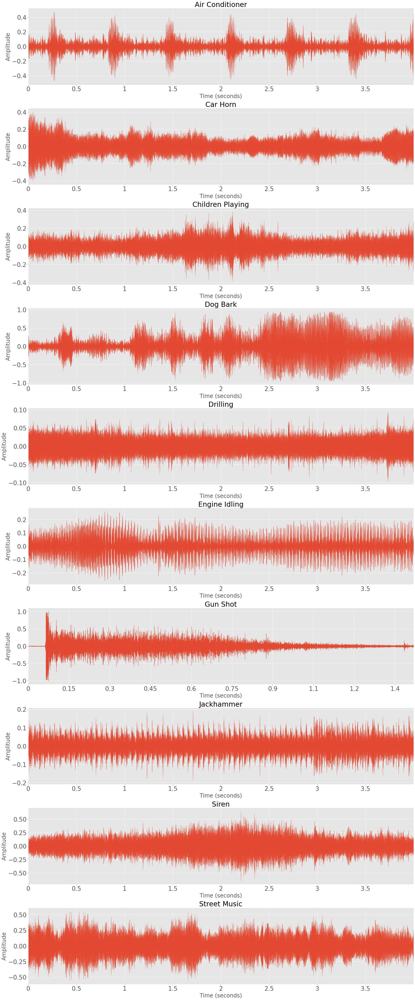

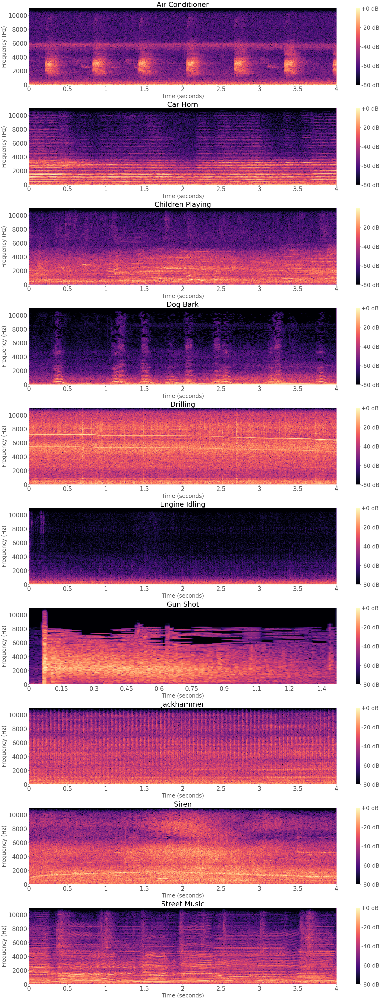

In [8]:
### Plot few sound clips along with their spectrograms ###

parent_dir = 'UrbanSound8K/audio/'
fold_name = 'fold1/'
sound_files = ['57320-0-0-7.wav','24074-1-0-3.wav','15564-2-0-1.wav',
               '31323-3-0-1.wav','46669-4-0-35.wav','89948-5-0-0.wav',
               '46656-6-0-0.wav','103074-7-3-2.wav','106905-8-0-0.wav',
               '108041-9-0-4.wav']
sound_names = ['air conditioner','car horn','children playing',
               'dog bark','drilling','engine idling',
               'gun shot','jackhammer','siren',
               'street music']

Fs = 22050 # default sample rate in librosa
w_len_ms = 24 # window size (miliseconds) 
N = int((w_len_ms/1000)*Fs)
H = N//4 # hop size

raw_sounds = load_sound_files(source_dir, parent_dir, fold_name, sound_files)
plot_waves(sound_names, raw_sounds, Fs)
plot_spectrogram(sound_names, raw_sounds, Fs, N, H)
play_audio(sound_names, raw_sounds, Fs)

## Feature Extraction

To extract the useful features from the sound data, we will use `Librosa` library. It provides several methods to extract a variety of features from the sound clip. We are going to use below mentioned methods to extract various features:

* *mfcc*: Mel-frequency cepstral coefficients. Fuente: [cuaderno en Anexo acerca *MFCC*](./anexo/mfcc-implementation-and-tutorial.ipynb).

* *chroma-stft*: Compute a chromagram from a waveform or power spectrogram. Fuente: [cuaderno en seminario FMP-UNTREF acerca *Visualization*](../../clases2/B/B_06_PythonVisualization.ipynb).

* *melspectrogram*: Compute a mel-scaled power spectrogram. Fuente: [cuaderno en Anexo acerca *MFCC*](./anexo/mfcc-implementation-and-tutorial.ipynb).

To make the process of feature extraction from sound clips easy, let's define **helper functions**. 

First `parse_audio_files` which takes parent directory name, sub directory and file extension (default is .wav) as input. It then iterates over all the files within sub directory and invoke a second helper function `extract_feature`. 

It takes a file path as input, *read* the file with `librosa.load` method, *extract* and *return* features mentioned above. These methods are all that is required to convert raw sound clips into informative features (along with a class label for each sound clip) that we can directly utilize to learn a model with classification method of our choice. 

Note, the *class label* of each sound clip is in the file name. For example, if the file name is `108041-9-0-4.wav` then the class label will be `9`. Doing string split by '-' and taking the second item of the array will give us the class label. 

To summarize, we will iterate over each file within a fold to extract *features* and corresponding *labels* and save them as numpy array.

In [9]:
### Define helper functions ###

def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    #stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    #chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    #mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    #return mfccs, chroma, mel
    return mfccs

def parse_audio_files(source_dir, parent_dir, sub_dir, file_ext='*.wav'):
    #total features: 40 (mfccs) + 12 (chroma) + 128 (mel) = 180
    features, labels = np.empty((0,40)), np.empty(0)  
    for fn in glob.glob(os.path.join(source_dir, parent_dir, sub_dir, file_ext)):
        print(fn.split('/')[7], fn.split('/')[8])
        #mfccs, chroma, mel = extract_feature(fn)
        #ext_features = np.hstack([mfccs,chroma,mel])
        mfccs = extract_feature(fn)
        ext_features = np.hstack([mfccs])
        features = np.vstack([features,ext_features])
        labels = np.append(labels, int(fn.split('/')[8].split('-')[1]))
    return np.array(features,dtype=np.float32), np.array(labels,dtype = np.int8)


In [10]:
### Pre-process and extract feature from the data ###

save_dir = 'UrbanSound8K/processed/'
sub_dirs = np.array(['fold1','fold2','fold3','fold4',
                    'fold5','fold6','fold7','fold8',
                    'fold9','fold10'])

for sub_dir in sub_dirs:
    features, labels = parse_audio_files(source_dir, parent_dir, sub_dir)
    np.savez("{0}{1}{2}".format(source_dir, save_dir, sub_dir), features=features, labels=labels)

fold1 88466-7-0-0.wav
fold1 118279-8-0-5.wav
fold1 26270-9-0-19.wav
fold1 77766-9-0-6.wav
fold1 176787-5-0-7.wav
fold1 51022-3-7-0.wav
fold1 124489-9-0-6.wav
fold1 17592-5-1-3.wav
fold1 103074-7-4-0.wav
fold1 139951-9-0-45.wav
fold1 164053-8-2-1.wav
fold1 78360-4-0-2.wav
fold1 203440-3-0-0.wav
fold1 55020-4-0-5.wav
fold1 180937-7-3-27.wav
fold1 118279-8-0-1.wav
fold1 103074-7-1-6.wav
fold1 73277-9-0-19.wav
fold1 157867-8-0-17.wav
fold1 51022-3-13-0.wav
fold1 179858-1-0-0.wav
fold1 65749-3-1-12.wav
fold1 180937-7-3-19.wav
fold1 103258-5-0-17.wav
fold1 165067-2-0-72.wav
fold1 134717-0-0-18.wav
fold1 143651-2-0-22.wav
fold1 151977-0-0-0.wav
fold1 26270-9-0-3.wav
fold1 134717-0-0-1.wav
fold1 24074-1-0-11.wav
fold1 177621-0-0-105.wav
fold1 113205-5-1-3.wav
fold1 113205-5-1-6.wav
fold1 176787-5-0-3.wav
fold1 157867-8-0-12.wav
fold1 54858-3-2-0.wav
fold1 108041-9-0-6.wav
fold1 165645-4-4-0.wav
fold1 72579-3-0-3.wav
fold1 21684-9-0-12.wav
fold1 40722-8-0-7.wav
fold1 157867-8-0-26.wav
fold1 229

/home/ale/miniconda3/lib/python3.8/site-packages/librosa/core/spectrum.py:222: UserWarning: n_fft=2048 is too small for input signal of length=1103
  warnings.warn(


fold1 57584-4-0-5.wav
fold1 174276-7-5-0.wav
fold1 157867-8-0-1.wav
fold1 78360-4-0-12.wav
fold1 21684-9-0-50.wav
fold1 180937-7-1-3.wav
fold1 108362-2-0-11.wav
fold1 155310-3-0-0.wav
fold1 57320-0-0-22.wav
fold1 157867-8-0-9.wav
fold1 103258-5-0-9.wav
fold1 108041-9-0-5.wav
fold1 57320-0-0-32.wav
fold1 46669-4-0-36.wav
fold1 14113-4-0-1.wav
fold1 124489-9-0-14.wav
fold1 72579-3-0-4.wav
fold1 147764-4-3-0.wav
fold1 17913-4-0-0.wav
fold1 135776-2-0-37.wav
fold1 147764-4-8-0.wav
fold1 174276-7-3-0.wav
fold1 24074-1-0-2.wav
fold1 143651-2-0-55.wav
fold1 113205-5-1-4.wav
fold1 159738-8-0-13.wav
fold1 43786-3-1-0.wav
fold1 78360-4-0-23.wav
fold1 143651-2-0-63.wav
fold1 103258-5-0-11.wav
fold1 17913-4-1-0.wav
fold1 57584-4-0-3.wav
fold1 55020-4-0-14.wav
fold1 180937-7-1-5.wav
fold1 57320-0-0-27.wav
fold1 177621-0-0-27.wav
fold1 155202-9-0-42.wav
fold1 87275-1-1-0.wav
fold1 172314-9-0-52.wav
fold1 98223-7-10-0.wav
fold1 182800-2-0-0.wav
fold1 139951-9-0-29.wav
fold1 57320-0-0-33.wav
fold1 592

/home/ale/miniconda3/lib/python3.8/site-packages/librosa/core/spectrum.py:222: UserWarning: n_fft=2048 is too small for input signal of length=1323
  warnings.warn(


fold1 134717-0-0-13.wav
fold1 177621-0-0-2.wav
fold1 98223-7-4-0.wav
fold1 180256-3-0-0.wav
fold1 176714-2-0-51.wav
fold1 180937-7-3-32.wav
fold1 103258-5-0-19.wav
fold1 159738-8-0-3.wav
fold1 57320-0-0-5.wav
fold1 21684-9-0-39.wav
fold1 132016-9-0-0.wav
fold1 99180-9-0-36.wav
fold1 180937-7-3-14.wav
fold1 9031-3-4-0.wav
fold1 177621-0-0-145.wav
fold1 21684-9-0-7.wav
fold1 59277-0-0-1.wav
fold1 146186-5-0-3.wav
fold1 182800-2-2-1.wav
fold1 108362-2-0-7.wav
fold1 78360-4-0-0.wav
fold1 139951-9-0-9.wav
fold1 180937-7-3-20.wav
fold1 102842-3-1-0.wav
fold1 124489-9-0-12.wav
fold1 69304-9-0-15.wav
fold1 113205-5-1-2.wav
fold1 105415-2-0-19.wav
fold1 174276-7-6-0.wav
fold1 174290-6-1-0.wav
fold1 113205-5-1-0.wav
fold1 176787-5-0-28.wav
fold1 177621-0-0-128.wav
fold1 24074-1-0-7.wav
fold1 44736-5-0-0.wav
fold1 135776-2-0-65.wav
fold1 103074-7-4-4.wav
fold1 180937-7-4-3.wav
fold1 177621-0-0-54.wav
fold1 157867-8-0-14.wav
fold1 174276-7-1-0.wav
fold1 40722-8-0-3.wav
fold1 132016-9-0-20.wav
fold

/home/ale/miniconda3/lib/python3.8/site-packages/librosa/core/spectrum.py:222: UserWarning: n_fft=2048 is too small for input signal of length=1523
  warnings.warn(


fold1 180937-7-0-5.wav
fold1 98223-7-8-0.wav
fold1 14113-4-0-0.wav
fold1 26270-9-0-32.wav
fold1 180937-7-3-17.wav
fold1 7061-6-0-0.wav
fold1 197318-6-9-0.wav
fold1 134717-0-0-5.wav
fold1 138031-2-0-28.wav
fold1 176787-5-0-9.wav
fold1 193698-2-0-89.wav
fold1 147764-4-7-0.wav
fold1 165067-2-0-9.wav
fold1 175851-1-0-0.wav
fold1 103258-5-0-13.wav
fold1 159738-8-0-2.wav
fold1 180937-7-3-0.wav
fold1 164312-3-0-0.wav
fold1 103258-5-0-10.wav
fold1 46669-4-0-9.wav
fold1 192124-2-0-12.wav
fold1 105415-2-0-1.wav
fold1 162703-1-0-0.wav
fold1 180937-7-3-23.wav
fold1 122690-6-0-0.wav
fold1 98223-7-9-0.wav
fold1 108362-2-0-23.wav
fold1 40722-8-0-1.wav
fold1 157867-8-0-0.wav
fold1 176787-5-0-29.wav
fold1 180937-7-3-7.wav
fold1 165642-4-0-0.wav
fold1 182800-2-2-3.wav
fold1 78360-4-0-16.wav
fold1 125791-3-0-13.wav
fold1 22962-4-0-2.wav
fold1 180937-7-3-15.wav
fold1 99180-9-0-2.wav
fold1 176787-5-0-25.wav
fold1 103074-7-2-0.wav
fold1 103258-5-0-14.wav
fold1 159738-8-0-8.wav
fold1 174290-6-3-0.wav
fold1 1

fold2 203929-7-5-7.wav
fold2 169098-7-0-8.wav
fold2 174906-2-0-11.wav
fold2 72567-1-2-1.wav
fold2 72567-1-4-5.wav
fold2 174906-2-0-8.wav
fold2 27349-3-1-2.wav
fold2 178521-2-0-69.wav
fold2 178520-2-0-28.wav
fold2 159750-8-0-0.wav
fold2 14387-9-0-7.wav
fold2 203128-3-3-0.wav
fold2 76086-4-0-55.wav
fold2 155129-1-2-0.wav
fold2 123688-8-2-4.wav
fold2 123688-8-0-7.wav
fold2 201652-5-3-0.wav
fold2 77751-4-1-1.wav
fold2 72567-1-5-0.wav
fold2 76090-6-1-0.wav
fold2 76091-6-4-0.wav
fold2 123688-8-0-10.wav
fold2 147926-0-0-16.wav
fold2 76091-6-5-0.wav
fold2 74507-0-0-18.wav
fold2 203929-7-4-1.wav
fold2 203929-7-1-7.wav
fold2 96169-9-1-10.wav
fold2 169098-7-4-1.wav
fold2 98202-9-1-5.wav
fold2 132073-1-6-0.wav
fold2 34621-4-11-0.wav
fold2 102871-8-0-8.wav
fold2 182739-2-0-78.wav
fold2 192269-2-0-1.wav
fold2 102871-8-0-14.wav
fold2 76086-4-0-14.wav
fold2 194841-9-0-144.wav
fold2 146690-0-0-125.wav
fold2 201652-5-2-4.wav
fold2 14387-9-0-12.wav
fold2 60605-9-0-95.wav
fold2 77751-4-4-0.wav
fold2 76089

fold2 189023-0-0-7.wav
fold2 178521-2-0-22.wav
fold2 152908-5-0-4.wav
fold2 74458-9-1-13.wav
fold2 174994-3-0-4.wav
fold2 203929-7-2-6.wav
fold2 201652-5-0-3.wav
fold2 203929-7-9-9.wav
fold2 89211-3-0-0.wav
fold2 73623-7-3-0.wav
fold2 59594-4-0-1.wav
fold2 149370-9-0-19.wav
fold2 172593-2-0-14.wav
fold2 177592-5-0-1.wav
fold2 44735-5-0-1.wav
fold2 166421-3-0-29.wav
fold2 177592-5-0-5.wav
fold2 159747-8-0-19.wav
fold2 74507-0-0-0.wav
fold2 201652-5-3-3.wav
fold2 203929-7-2-8.wav
fold2 172593-2-0-10.wav
fold2 204773-3-7-1.wav
fold2 178520-2-0-38.wav
fold2 74507-0-0-27.wav
fold2 185800-4-2-0.wav
fold2 104817-4-0-3.wav
fold2 201652-5-2-3.wav
fold2 196384-9-0-15.wav
fold2 123688-8-1-4.wav
fold2 72567-1-4-1.wav
fold2 146690-0-0-116.wav
fold2 178520-2-0-39.wav
fold2 132073-1-0-0.wav
fold2 91396-8-0-2.wav
fold2 159747-8-0-8.wav
fold2 102858-5-0-0.wav
fold2 172593-2-0-22.wav
fold2 197320-6-1-0.wav
fold2 50416-4-0-1.wav
fold2 50898-5-0-0.wav
fold2 60605-9-0-73.wav
fold2 192269-2-0-37.wav
fold2 1

fold2 203929-7-2-11.wav
fold2 34621-4-8-0.wav
fold2 160366-3-0-13.wav
fold2 159750-8-0-1.wav
fold2 147926-0-0-11.wav
fold2 76086-4-0-32.wav
fold2 156893-7-8-0.wav
fold2 169098-7-0-4.wav
fold2 185800-4-2-2.wav
fold2 59594-4-0-4.wav
fold2 145608-6-2-0.wav
fold2 34621-4-4-0.wav
fold2 182739-2-0-13.wav
fold2 77751-4-6-0.wav
fold2 180126-4-4-1.wav
fold2 201652-5-5-4.wav
fold2 203929-7-7-16.wav
fold2 147926-0-0-20.wav
fold2 34621-4-0-0.wav
fold2 106015-5-0-18.wav
fold2 203929-7-9-20.wav
fold2 34621-4-24-0.wav
fold2 143970-5-0-2.wav
fold2 147926-0-0-42.wav
fold2 201652-5-2-2.wav
fold2 160011-2-0-9.wav
fold2 102871-8-0-3.wav
fold2 168713-9-0-32.wav
fold2 159750-8-0-5.wav
fold2 104817-4-0-11.wav
fold2 197320-6-0-0.wav
fold2 159747-8-0-13.wav
fold2 76091-6-0-0.wav
fold2 174994-3-0-1.wav
fold2 146690-0-0-86.wav
fold2 102104-3-0-0.wav
fold2 192269-2-0-56.wav
fold2 180126-4-1-2.wav
fold2 189023-0-0-3.wav
fold2 203929-7-6-1.wav
fold2 178521-2-0-18.wav
fold2 178521-2-0-70.wav
fold2 160366-3-0-8.wav
f

fold3 186334-2-0-35.wav
fold3 155263-2-0-43.wav
fold3 31884-7-0-3.wav
fold3 207124-3-0-0.wav
fold3 30204-0-0-6.wav
fold3 49485-9-0-24.wav
fold3 177742-0-0-161.wav
fold3 186336-9-0-1.wav
fold3 54898-8-0-2.wav
fold3 94631-9-0-16.wav
fold3 62837-7-0-9.wav
fold3 146714-0-0-33.wav
fold3 94636-8-0-21.wav
fold3 76221-2-0-6.wav
fold3 162431-6-1-0.wav
fold3 177742-0-0-49.wav
fold3 62837-7-1-11.wav
fold3 17853-5-0-8.wav
fold3 103199-4-7-2.wav
fold3 165039-7-4-1.wav
fold3 121528-8-1-0.wav
fold3 20841-3-6-0.wav
fold3 37560-4-0-5.wav
fold3 94636-8-0-19.wav
fold3 90014-8-0-1.wav
fold3 107228-5-0-5.wav
fold3 195451-5-0-20.wav
fold3 165039-7-13-0.wav
fold3 66622-4-0-8.wav
fold3 144068-5-4-5.wav
fold3 116400-3-0-2.wav
fold3 94631-9-1-3.wav
fold3 103199-4-0-0.wav
fold3 22601-8-0-6.wav
fold3 151149-2-0-4.wav
fold3 186336-9-0-2.wav
fold3 165039-7-12-1.wav
fold3 13230-0-0-28.wav
fold3 116400-3-1-0.wav
fold3 166101-5-0-0.wav
fold3 42097-7-0-0.wav
fold3 135526-6-13-0.wav
fold3 199769-1-0-9.wav
fold3 93065-9-

fold3 37560-4-0-2.wav
fold3 12647-3-3-0.wav
fold3 13230-0-0-16.wav
fold3 41372-3-0-39.wav
fold3 155263-2-0-61.wav
fold3 144068-5-0-12.wav
fold3 62837-7-1-45.wav
fold3 63095-4-0-1.wav
fold3 62837-7-0-15.wav
fold3 22601-8-0-23.wav
fold3 155263-2-0-57.wav
fold3 20841-3-2-0.wav
fold3 63095-4-1-18.wav
fold3 69598-4-0-0.wav
fold3 34708-6-3-0.wav
fold3 69598-4-5-0.wav
fold3 76094-6-1-0.wav
fold3 9674-1-0-0.wav
fold3 62837-7-1-41.wav
fold3 62837-7-1-63.wav
fold3 18594-1-5-0.wav
fold3 19338-5-3-0.wav
fold3 17615-3-0-0.wav
fold3 94631-9-1-16.wav
fold3 13230-0-0-6.wav
fold3 18594-1-3-0.wav
fold3 73373-3-0-0.wav
fold3 117048-3-0-35.wav
fold3 103199-4-2-7.wav
fold3 13230-0-0-20.wav
fold3 31884-7-1-3.wav
fold3 156418-3-0-0.wav
fold3 15356-2-0-0.wav
fold3 197074-3-0-6.wav
fold3 195451-5-0-16.wav
fold3 31884-7-0-1.wav
fold3 182103-9-0-26.wav
fold3 177742-0-0-164.wav
fold3 62837-7-1-29.wav
fold3 6988-5-0-2.wav
fold3 94636-8-0-9.wav
fold3 62837-7-0-37.wav
fold3 186336-9-0-0.wav
fold3 128030-3-2-0.wav
fo

fold4 159751-8-0-8.wav
fold4 76568-9-0-14.wav
fold4 179862-1-0-0.wav
fold4 81068-5-2-0.wav
fold4 144007-5-1-4.wav
fold4 131428-9-1-0.wav
fold4 159751-8-0-19.wav
fold4 344-3-1-0.wav
fold4 22883-7-91-0.wav
fold4 24347-8-0-78.wav
fold4 60608-9-0-3.wav
fold4 183989-3-1-18.wav
fold4 159753-8-0-4.wav
fold4 24347-8-0-34.wav
fold4 185909-2-0-87.wav
fold4 144007-5-0-14.wav
fold4 61790-9-0-16.wav
fold4 151005-4-0-1.wav
fold4 35549-9-0-51.wav
fold4 24347-8-0-38.wav
fold4 16692-5-0-0.wav
fold4 34056-2-0-40.wav
fold4 62461-0-0-3.wav
fold4 174026-3-2-2.wav
fold4 74723-3-0-1.wav
fold4 148463-7-3-6.wav
fold4 16692-5-0-6.wav
fold4 22883-7-17-4.wav
fold4 72829-3-0-1.wav
fold4 24347-8-0-0.wav
fold4 24347-8-0-22.wav
fold4 174032-2-0-18.wav
fold4 185909-2-0-116.wav
fold4 159752-8-1-0.wav
fold4 187356-1-2-0.wav
fold4 161010-1-3-0.wav
fold4 144351-4-3-14.wav
fold4 209864-5-0-1.wav
fold4 177756-2-0-12.wav
fold4 144007-5-1-1.wav
fold4 17480-2-0-30.wav
fold4 42954-9-0-2.wav
fold4 144007-5-0-15.wav
fold4 63932-3

fold4 34056-2-0-61.wav
fold4 131428-9-1-9.wav
fold4 144007-5-0-2.wav
fold4 24347-8-0-95.wav
fold4 14110-4-0-0.wav
fold4 47019-2-0-55.wav
fold4 55728-9-0-34.wav
fold4 159176-3-0-0.wav
fold4 54173-2-0-18.wav
fold4 144351-4-0-1.wav
fold4 137971-2-0-4.wav
fold4 144351-4-3-10.wav
fold4 22883-7-54-0.wav
fold4 7064-6-2-0.wav
fold4 107653-9-0-3.wav
fold4 170564-2-1-34.wav
fold4 344-3-4-0.wav
fold4 34056-2-0-22.wav
fold4 174032-2-0-1.wav
fold4 16692-5-0-3.wav
fold4 159752-8-0-6.wav
fold4 204765-1-0-0.wav
fold4 135528-6-2-0.wav
fold4 61626-9-0-10.wav
fold4 185909-2-0-13.wav
fold4 173994-3-0-45.wav
fold4 7389-1-4-7.wav
fold4 169466-4-0-12.wav
fold4 151005-4-3-0.wav
fold4 16692-5-0-7.wav
fold4 185709-0-0-8.wav
fold4 135528-6-3-0.wav
fold4 185909-2-0-17.wav
fold4 171305-7-22-0.wav
fold4 128607-4-0-4.wav
fold4 146709-0-0-26.wav
fold4 169466-4-3-12.wav
fold4 76585-9-0-60.wav
fold4 34931-3-0-0.wav
fold4 174841-1-0-0.wav
fold4 166942-0-0-3.wav
fold4 159751-8-0-13.wav
fold4 174032-2-0-17.wav
fold4 55728

fold4 154758-5-0-13.wav
fold4 35799-6-0-0.wav
fold4 158608-8-0-2.wav
fold4 55018-0-0-87.wav
fold4 128160-5-0-10.wav
fold4 34056-2-0-2.wav
fold4 22883-7-18-0.wav
fold4 22883-7-39-0.wav
fold4 22883-7-53-0.wav
fold4 42954-9-0-12.wav
fold4 55728-9-0-67.wav
fold4 128160-5-0-4.wav
fold4 132016-7-0-5.wav
fold4 7389-1-4-14.wav
fold4 38231-3-0-0.wav
fold4 206037-2-0-25.wav
fold4 24347-8-0-5.wav
fold4 173994-3-0-3.wav
fold4 16692-5-0-5.wav
fold4 148463-7-2-1.wav
fold4 158608-8-0-7.wav
fold4 24347-8-0-47.wav
fold4 24347-8-0-40.wav
fold4 195969-0-0-5.wav
fold4 144351-4-3-2.wav
fold4 24347-8-0-18.wav
fold4 156362-4-3-3.wav
fold4 22883-7-69-0.wav
fold4 144007-5-0-8.wav
fold4 22883-7-35-3.wav
fold4 166942-0-0-1.wav
fold4 24347-8-0-41.wav
fold4 137971-2-0-0.wav
fold4 24347-8-0-14.wav
fold4 195969-0-0-25.wav
fold4 81068-5-0-0.wav
fold4 144007-5-1-10.wav
fold4 74723-3-0-0.wav
fold4 146709-0-0-48.wav
fold4 135528-6-4-1.wav
fold4 38231-3-4-0.wav
fold4 22883-7-110-1.wav
fold4 159752-8-2-1.wav
fold4 195969-

fold5 17578-5-0-5.wav
fold5 178686-0-0-66.wav
fold5 83196-9-0-9.wav
fold5 71171-4-1-5.wav
fold5 162432-6-2-0.wav
fold5 104998-7-2-4.wav
fold5 203913-8-1-3.wav
fold5 108357-9-0-15.wav
fold5 20285-3-1-1.wav
fold5 180125-4-1-8.wav
fold5 118440-4-0-0.wav
fold5 118440-4-1-0.wav
fold5 180052-3-0-4.wav
fold5 162432-6-5-0.wav
fold5 62566-5-0-3.wav
fold5 180128-4-4-0.wav
fold5 162318-2-0-39.wav
fold5 156869-8-0-10.wav
fold5 17578-5-0-28.wav
fold5 180128-4-7-5.wav
fold5 91533-5-0-0.wav
fold5 90013-7-0-6.wav
fold5 116163-3-2-0.wav
fold5 72259-1-10-4.wav
fold5 23219-5-0-12.wav
fold5 17578-5-0-27.wav
fold5 85569-0-0-5.wav
fold5 17578-5-0-33.wav
fold5 162432-6-11-0.wav
fold5 84699-4-5-0.wav
fold5 60846-0-0-2.wav
fold5 90013-7-1-1.wav
fold5 178825-2-0-53.wav
fold5 29937-3-0-14.wav
fold5 178686-0-0-16.wav
fold5 145611-6-2-0.wav
fold5 104998-7-7-7.wav
fold5 71171-4-0-0.wav
fold5 160010-2-0-37.wav
fold5 100852-0-0-20.wav
fold5 178686-0-0-42.wav
fold5 128152-9-0-49.wav
fold5 203654-9-0-15.wav
fold5 17826

fold5 205874-4-4-0.wav
fold5 156634-5-1-0.wav
fold5 115239-9-0-5.wav
fold5 104998-7-16-7.wav
fold5 162318-2-0-25.wav
fold5 72259-1-9-14.wav
fold5 62566-5-0-2.wav
fold5 104998-7-16-5.wav
fold5 111671-8-0-6.wav
fold5 17578-5-0-30.wav
fold5 173993-3-0-51.wav
fold5 156634-5-0-8.wav
fold5 126521-3-0-18.wav
fold5 128152-9-0-67.wav
fold5 80806-2-0-5.wav
fold5 100852-0-0-26.wav
fold5 46391-1-0-0.wav
fold5 165774-7-5-0.wav
fold5 26184-5-4-2.wav
fold5 178260-7-1-5.wav
fold5 100263-2-0-36.wav
fold5 203913-8-0-10.wav
fold5 72259-1-7-14.wav
fold5 36263-9-0-13.wav
fold5 72259-1-10-1.wav
fold5 194910-9-0-65.wav
fold5 104998-7-15-9.wav
fold5 111671-8-0-20.wav
fold5 203516-3-0-0.wav
fold5 180128-4-6-2.wav
fold5 71171-4-3-2.wav
fold5 180128-4-9-0.wav
fold5 165774-7-2-0.wav
fold5 171388-9-0-88.wav
fold5 121286-0-0-12.wav
fold5 31150-2-0-17.wav
fold5 90013-7-0-7.wav
fold5 190893-2-0-23.wav
fold5 155243-9-0-53.wav
fold5 104998-7-10-9.wav
fold5 121286-0-0-7.wav
fold5 165774-7-0-0.wav
fold5 90013-7-0-3.wav
f

fold5 36263-9-0-3.wav
fold5 72259-1-7-22.wav
fold5 156869-8-0-1.wav
fold5 20285-3-1-0.wav
fold5 17578-5-0-2.wav
fold5 156869-8-0-3.wav
fold5 111671-8-0-19.wav
fold5 173993-3-0-52.wav
fold5 72259-1-2-0.wav
fold5 77233-3-0-105.wav
fold5 71439-1-0-0.wav
fold5 104421-2-0-5.wav
fold5 162318-2-0-17.wav
fold5 172460-9-0-91.wav
fold5 171388-9-0-246.wav
fold5 23219-5-0-9.wav
fold5 187920-7-0-0.wav
fold5 139665-9-0-9.wav
fold5 156634-5-0-2.wav
fold5 139665-9-0-19.wav
fold5 156869-8-0-8.wav
fold5 155243-9-0-42.wav
fold5 178686-0-0-7.wav
fold5 180125-4-2-17.wav
fold5 72259-1-10-9.wav
fold5 204408-2-0-36.wav
fold5 104998-7-8-6.wav
fold5 84699-4-0-0.wav
fold5 205874-4-2-0.wav
fold5 203913-8-1-0.wav
fold5 104998-7-15-1.wav
fold5 104998-7-7-1.wav
fold5 178686-0-0-53.wav
fold5 180128-4-16-1.wav
fold5 100263-2-0-117.wav
fold5 121286-0-0-11.wav
fold5 108357-9-0-27.wav
fold5 85569-0-0-6.wav
fold5 205874-4-1-0.wav
fold5 100852-0-0-1.wav
fold5 72259-1-9-7.wav
fold5 19503-3-2-0.wav
fold5 7066-6-1-0.wav
fold5

fold6 99710-9-0-16.wav
fold6 204240-0-0-26.wav
fold6 184805-0-0-81.wav
fold6 190680-3-6-0.wav
fold6 184805-0-0-61.wav
fold6 43802-1-0-0.wav
fold6 204240-0-0-30.wav
fold6 184805-0-0-54.wav
fold6 18933-1-0-0.wav
fold6 34643-4-0-0.wav
fold6 118072-3-0-0.wav
fold6 155488-3-2-0.wav
fold6 30206-7-0-13.wav
fold6 131918-7-0-6.wav
fold6 35548-9-2-7.wav
fold6 66623-4-0-6.wav
fold6 94632-5-1-19.wav
fold6 28284-3-0-0.wav
fold6 58005-4-0-23.wav
fold6 98263-9-0-24.wav
fold6 128465-1-0-7.wav
fold6 58005-4-0-24.wav
fold6 30206-7-0-30.wav
fold6 106486-5-0-1.wav
fold6 184805-0-0-77.wav
fold6 107842-4-3-0.wav
fold6 194753-3-0-0.wav
fold6 74726-8-0-4.wav
fold6 184805-0-0-40.wav
fold6 155488-3-3-0.wav
fold6 165641-4-0-0.wav
fold6 193697-2-0-5.wav
fold6 167701-4-5-0.wav
fold6 132021-7-0-9.wav
fold6 39854-5-1-4.wav
fold6 30206-7-0-25.wav
fold6 44325-9-0-67.wav
fold6 74726-8-0-3.wav
fold6 34952-8-0-0.wav
fold6 34952-8-0-3.wav
fold6 74726-8-0-8.wav
fold6 42955-9-0-18.wav
fold6 58005-4-0-63.wav
fold6 204240-0-0

fold6 105319-3-0-22.wav
fold6 24364-4-0-4.wav
fold6 74726-8-0-6.wav
fold6 194321-9-0-6.wav
fold6 39884-5-0-3.wav
fold6 128891-3-0-2.wav
fold6 94632-5-1-7.wav
fold6 94632-5-0-0.wav
fold6 128465-1-0-8.wav
fold6 111386-5-1-3.wav
fold6 14114-4-0-0.wav
fold6 131918-7-0-2.wav
fold6 121285-0-0-4.wav
fold6 107842-4-2-0.wav
fold6 98263-9-0-1.wav
fold6 135544-6-5-0.wav
fold6 124389-8-1-2.wav
fold6 132162-9-1-3.wav
fold6 161923-3-0-5.wav
fold6 30206-7-0-21.wav
fold6 166931-4-4-0.wav
fold6 36902-3-0-0.wav
fold6 182474-1-0-0.wav
fold6 82368-2-0-30.wav
fold6 107842-4-2-4.wav
fold6 63724-0-0-7.wav
fold6 184805-0-0-88.wav
fold6 128465-1-0-5.wav
fold6 94632-5-1-13.wav
fold6 50455-5-0-0.wav
fold6 97392-3-0-0.wav
fold6 97331-2-0-13.wav
fold6 94632-5-0-28.wav
fold6 135544-6-4-0.wav
fold6 78651-5-0-2.wav
fold6 107842-4-2-2.wav
fold6 66623-4-0-3.wav
fold6 166931-4-0-1.wav
fold6 43802-1-1-0.wav
fold6 124389-8-1-8.wav
fold6 34952-8-0-6.wav
fold6 122738-9-0-9.wav
fold6 169045-2-0-16.wav
fold6 110868-9-0-15.wav

fold7 81788-2-0-12.wav
fold7 155238-2-0-97.wav
fold7 36264-9-0-10.wav
fold7 146845-0-0-14.wav
fold7 6902-2-0-5.wav
fold7 209992-5-4-15.wav
fold7 77751-7-9-3.wav
fold7 57323-8-0-8.wav
fold7 24965-3-3-0.wav
fold7 135527-6-14-9.wav
fold7 34871-3-9-0.wav
fold7 189981-0-0-17.wav
fold7 170243-1-0-0.wav
fold7 43805-8-2-0.wav
fold7 107357-8-1-18.wav
fold7 57596-3-0-0.wav
fold7 61503-2-0-8.wav
fold7 107357-8-1-2.wav
fold7 201988-5-0-15.wav
fold7 57696-4-0-1.wav
fold7 146845-0-0-18.wav
fold7 149193-5-0-0.wav
fold7 101848-9-0-0.wav
fold7 110918-3-0-1.wav
fold7 34871-3-6-0.wav
fold7 202516-0-0-1.wav
fold7 66619-2-0-11.wav
fold7 135849-4-0-0.wav
fold7 189987-0-0-1.wav
fold7 174284-6-1-0.wav
fold7 107357-8-1-15.wav
fold7 105289-8-2-3.wav
fold7 135527-6-14-6.wav
fold7 209992-5-2-77.wav
fold7 177729-0-0-108.wav
fold7 177537-7-0-5.wav
fold7 77674-3-0-0.wav
fold7 155299-3-1-1.wav
fold7 168846-5-1-3.wav
fold7 27216-3-0-18.wav
fold7 6902-2-0-26.wav
fold7 115242-9-0-83.wav
fold7 89099-4-0-0.wav
fold7 15859

fold7 65745-3-0-21.wav
fold7 57323-8-0-1.wav
fold7 127443-4-0-3.wav
fold7 135527-6-14-0.wav
fold7 105289-8-1-0.wav
fold7 155314-3-0-5.wav
fold7 189981-0-0-16.wav
fold7 135527-6-9-0.wav
fold7 189981-0-0-3.wav
fold7 146845-0-0-22.wav
fold7 168846-5-1-4.wav
fold7 177729-0-0-20.wav
fold7 171165-9-0-15.wav
fold7 181102-9-0-117.wav
fold7 189981-0-0-6.wav
fold7 189981-0-0-1.wav
fold7 57696-4-0-0.wav
fold7 82024-3-0-5.wav
fold7 201988-5-0-7.wav
fold7 135527-6-12-0.wav
fold7 130961-4-5-2.wav
fold7 107357-8-0-4.wav
fold7 171165-9-0-84.wav
fold7 171184-9-0-18.wav
fold7 81788-2-0-69.wav
fold7 157950-3-0-0.wav
fold7 209992-5-4-17.wav
fold7 135527-6-8-0.wav
fold7 177537-7-0-24.wav
fold7 50614-3-0-0.wav
fold7 14772-7-1-0.wav
fold7 146845-0-0-16.wav
fold7 177537-7-0-3.wav
fold7 177537-7-0-16.wav
fold7 183992-3-0-6.wav
fold7 135527-6-2-0.wav
fold7 97606-7-4-0.wav
fold7 105289-8-0-0.wav
fold7 146845-0-0-5.wav
fold7 194962-5-0-0.wav
fold7 74513-3-0-0.wav
fold7 57323-8-0-0.wav
fold7 107357-8-1-11.wav
fold

fold8 168037-4-9-0.wav
fold8 162103-0-0-2.wav
fold8 177726-0-0-36.wav
fold8 205610-4-0-3.wav
fold8 169043-2-0-13.wav
fold8 179039-9-0-38.wav
fold8 168037-4-8-0.wav
fold8 196561-3-0-29.wav
fold8 71177-8-1-3.wav
fold8 42324-4-2-3.wav
fold8 113216-5-0-2.wav
fold8 72015-2-0-1.wav
fold8 125678-7-3-6.wav
fold8 115240-9-0-34.wav
fold8 125678-7-1-2.wav
fold8 180134-4-2-11.wav
fold8 174873-3-5-12.wav
fold8 68080-7-0-4.wav
fold8 125678-7-2-6.wav
fold8 125678-7-4-8.wav
fold8 133090-2-0-64.wav
fold8 54383-0-0-11.wav
fold8 29936-3-0-0.wav
fold8 186935-5-0-1.wav
fold8 80589-0-0-3.wav
fold8 54383-0-0-10.wav
fold8 193699-2-0-62.wav
fold8 186940-5-0-0.wav
fold8 42324-4-2-1.wav
fold8 30226-3-1-1.wav
fold8 133090-2-0-37.wav
fold8 54383-0-0-1.wav
fold8 33340-7-0-0.wav
fold8 122199-3-1-1.wav
fold8 74677-0-0-3.wav
fold8 24728-7-2-0.wav
fold8 74677-0-0-75.wav
fold8 180132-4-3-0.wav
fold8 205610-4-0-1.wav
fold8 162433-6-2-0.wav
fold8 72221-3-1-0.wav
fold8 110688-3-0-11.wav
fold8 157868-8-0-24.wav
fold8 117181

fold8 169043-2-0-24.wav
fold8 207369-3-0-0.wav
fold8 62048-3-0-5.wav
fold8 196068-2-0-0.wav
fold8 71177-8-1-0.wav
fold8 167702-4-6-0.wav
fold8 142003-2-0-21.wav
fold8 74677-0-0-6.wav
fold8 117181-8-0-7.wav
fold8 72221-3-4-5.wav
fold8 161129-4-0-15.wav
fold8 54383-0-0-0.wav
fold8 7390-9-0-0.wav
fold8 168037-4-11-0.wav
fold8 161129-4-0-9.wav
fold8 177726-0-0-27.wav
fold8 33340-7-7-0.wav
fold8 31325-3-1-1.wav
fold8 148632-8-0-9.wav
fold8 68080-7-0-0.wav
fold8 156358-5-0-6.wav
fold8 44110-3-3-0.wav
fold8 42324-4-2-4.wav
fold8 180134-4-2-13.wav
fold8 16860-9-0-45.wav
fold8 194733-9-0-7.wav
fold8 6984-1-0-0.wav
fold8 157868-8-0-8.wav
fold8 157868-8-0-19.wav
fold8 113202-5-0-19.wav
fold8 39967-9-0-44.wav
fold8 168037-4-4-0.wav
fold8 74677-0-0-57.wav
fold8 177726-0-0-28.wav
fold8 14386-9-0-17.wav
fold8 113203-5-0-6.wav
fold8 91209-5-0-2.wav
fold8 55013-3-0-3.wav
fold8 177726-0-0-22.wav
fold8 177726-0-0-29.wav
fold8 189846-3-4-0.wav
fold8 71700-3-4-0.wav
fold8 66599-9-0-17.wav
fold8 113202-5-0-

fold8 162433-6-0-0.wav
fold8 70168-3-1-13.wav
fold8 50668-5-0-1.wav
fold8 125678-7-0-2.wav
fold8 36429-2-0-23.wav
fold8 144028-3-1-0.wav
fold8 169043-2-0-15.wav
fold8 160016-2-0-5.wav
fold8 156358-5-0-4.wav
fold8 162103-0-0-9.wav
fold8 113203-5-6-0.wav
fold8 117181-8-0-3.wav
fold8 205610-4-0-4.wav
fold8 76085-4-0-37.wav
fold9 207211-2-0-11.wav
fold9 52740-3-0-1.wav
fold9 149929-9-1-0.wav
fold9 70098-3-0-0.wav
fold9 136399-6-6-0.wav
fold9 79089-0-0-92.wav
fold9 171406-9-0-23.wav
fold9 101729-0-0-23.wav
fold9 105029-7-1-7.wav
fold9 54976-4-1-2.wav
fold9 101729-0-0-21.wav
fold9 145683-6-2-0.wav
fold9 189988-0-0-4.wav
fold9 152588-3-1-0.wav
fold9 14111-4-0-6.wav
fold9 174786-2-0-18.wav
fold9 105088-3-0-8.wav
fold9 165567-3-0-0.wav
fold9 180156-1-0-0.wav
fold9 13579-2-0-2.wav
fold9 54976-4-0-5.wav
fold9 105029-7-2-14.wav
fold9 159744-8-0-6.wav
fold9 54976-4-1-0.wav
fold9 161005-2-0-28.wav
fold9 62567-5-0-6.wav
fold9 159748-8-0-4.wav
fold9 62567-5-0-1.wav
fold9 105029-7-0-5.wav
fold9 156200-

fold9 14527-9-0-4.wav
fold9 103249-5-0-4.wav
fold9 159748-8-2-8.wav
fold9 157866-8-0-16.wav
fold9 188823-7-0-1.wav
fold9 54823-3-0-0.wav
fold9 103249-5-0-6.wav
fold9 106955-6-0-0.wav
fold9 72265-3-5-0.wav
fold9 13579-2-0-53.wav
fold9 180937-4-1-30.wav
fold9 207211-2-0-82.wav
fold9 96921-9-0-1.wav
fold9 105029-7-2-5.wav
fold9 159748-8-0-7.wav
fold9 119809-7-0-1.wav
fold9 75743-0-0-9.wav
fold9 75743-0-0-22.wav
fold9 119449-5-0-5.wav
fold9 168906-9-0-47.wav
fold9 79089-0-0-12.wav
fold9 187075-5-0-5.wav
fold9 207211-2-0-88.wav
fold9 152588-3-3-0.wav
fold9 59037-2-4-8.wav
fold9 79089-0-0-70.wav
fold9 152570-9-1-61.wav
fold9 145683-6-3-0.wav
fold9 39856-5-0-21.wav
fold9 69777-3-0-2.wav
fold9 50223-3-0-3.wav
fold9 75743-0-0-10.wav
fold9 180156-1-4-0.wav
fold9 75743-0-0-20.wav
fold9 54976-4-1-3.wav
fold9 14111-4-0-0.wav
fold9 75743-0-0-5.wav
fold9 59037-2-4-5.wav
fold9 98859-7-2-3.wav
fold9 145683-6-4-0.wav
fold9 54976-4-0-8.wav
fold9 57105-3-4-2.wav
fold9 136399-6-1-0.wav
fold9 18592-5-0-3.wa

fold9 194310-9-0-7.wav
fold9 192123-2-0-10.wav
fold9 161005-2-0-12.wav
fold9 59037-2-4-3.wav
fold9 57105-3-1-0.wav
fold9 145390-9-0-13.wav
fold9 103249-5-0-5.wav
fold9 188823-7-0-4.wav
fold9 99500-2-0-2.wav
fold9 174786-2-0-27.wav
fold9 159748-8-2-6.wav
fold9 105088-3-0-19.wav
fold9 66601-8-0-3.wav
fold9 175915-3-0-0.wav
fold9 159726-3-1-0.wav
fold9 149255-9-0-7.wav
fold9 101729-0-0-1.wav
fold9 58937-4-0-0.wav
fold9 165567-3-3-0.wav
fold9 157866-8-0-27.wav
fold9 178118-3-2-0.wav
fold9 75743-0-0-21.wav
fold9 161005-2-0-19.wav
fold9 62567-5-0-7.wav
fold9 39532-4-2-0.wav
fold9 185374-9-0-16.wav
fold9 127538-4-0-0.wav
fold9 159748-8-0-0.wav
fold9 165454-0-0-9.wav
fold9 137803-3-0-1.wav
fold9 152588-3-2-0.wav
fold9 180937-4-0-11.wav
fold9 105029-7-1-9.wav
fold9 157866-8-0-3.wav
fold9 159745-8-1-6.wav
fold9 155242-9-0-12.wav
fold9 105029-7-4-1.wav
fold9 79584-3-0-8.wav
fold9 119420-3-1-0.wav
fold9 168906-9-0-73.wav
fold9 159744-8-0-1.wav
fold9 180937-4-3-9.wav
fold9 58937-4-2-10.wav
fold9 15

fold10 129750-2-0-36.wav
fold10 102857-5-0-9.wav
fold10 51024-3-0-3.wav
fold10 41306-3-0-4.wav
fold10 167464-0-0-21.wav
fold10 178261-7-3-0.wav
fold10 159742-8-0-5.wav
fold10 39847-5-0-12.wav
fold10 205013-6-0-0.wav
fold10 34050-7-2-0.wav
fold10 14468-3-0-3.wav
fold10 115241-9-0-9.wav
fold10 73524-0-0-5.wav
fold10 100795-3-1-1.wav
fold10 99192-4-0-32.wav
fold10 102857-5-0-30.wav
fold10 118278-4-0-5.wav
fold10 188813-7-0-0.wav
fold10 93567-8-0-10.wav
fold10 208652-8-2-0.wav
fold10 202334-9-0-137.wav
fold10 102857-5-0-19.wav
fold10 118278-4-0-0.wav
fold10 175842-1-0-0.wav
fold10 181624-4-10-0.wav
fold10 14470-2-0-70.wav
fold10 54086-1-0-0.wav
fold10 74364-8-1-6.wav
fold10 164194-2-0-14.wav
fold10 69661-3-0-14.wav
fold10 200786-5-1-1.wav
fold10 164377-9-1-3.wav
fold10 99192-4-0-1.wav
fold10 162134-7-14-1.wav
fold10 54086-1-2-0.wav
fold10 7965-3-16-0.wav
fold10 83195-9-0-6.wav
fold10 159742-8-0-7.wav
fold10 189982-0-0-19.wav
fold10 155280-2-0-13.wav
fold10 180127-4-0-12.wav
fold10 141240-5

fold10 74364-8-1-2.wav
fold10 74364-8-1-5.wav
fold10 162134-7-7-1.wav
fold10 81791-3-1-0.wav
fold10 188813-7-10-1.wav
fold10 84249-9-0-8.wav
fold10 157207-6-7-0.wav
fold10 118278-4-0-9.wav
fold10 180127-4-0-11.wav
fold10 20571-3-1-0.wav
fold10 157207-6-2-0.wav
fold10 84249-9-0-10.wav
fold10 178261-7-3-1.wav
fold10 34050-7-1-0.wav
fold10 83502-0-0-0.wav
fold10 189982-0-0-44.wav
fold10 2937-1-0-0.wav
fold10 102857-5-0-28.wav
fold10 162148-3-0-0.wav
fold10 34050-7-3-0.wav
fold10 180127-4-0-21.wav
fold10 136558-9-1-10.wav
fold10 83502-0-0-6.wav
fold10 199261-3-0-2.wav
fold10 167464-0-0-18.wav
fold10 178261-7-0-0.wav
fold10 103438-5-0-0.wav
fold10 14470-2-0-10.wav
fold10 202334-9-0-105.wav
fold10 180127-4-0-18.wav
fold10 189982-0-0-20.wav
fold10 162134-7-14-0.wav
fold10 138017-9-0-9.wav
fold10 102857-5-0-12.wav
fold10 74364-8-1-21.wav
fold10 39847-5-0-10.wav
fold10 69661-3-0-23.wav
fold10 162134-7-10-2.wav
fold10 99192-4-0-30.wav
fold10 200460-6-5-0.wav
fold10 74364-8-1-23.wav
fold10 88121-

## Sound Classifier

### Model Building + Compilation

Now as we have pre-processed our dataset, it’s time to implement a simple feedforward neural network in Keras (Tensorflow) to classify each sound clip into a different category.

The code provided below defines a standard feedforward neural network of three layers, each with 256, 128, and 64 units, respectively.

In [11]:
### Initialize the model ###
### Define the network architecture ###
### Compile the model ###

def get_network():
    input_shape = (40,)
    num_classes = 10
    opt = Adam(lr=1e-4)
    clear_session()
    
    model = Sequential()
    model.add(Dense(256, input_shape=input_shape, activation="relu"))
    model.add(Dense(128, input_shape=input_shape, activation="relu"))
    model.add(Dense(64, input_shape=input_shape, activation="relu"))
    model.add(Dense(num_classes, activation = "softmax"))
    model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
    
    return model

### Generation of train and test Datasets via Cross-validation

In accordance with [`urbansound8k dataset`](https://urbansounddataset.weebly.com/urbansound8k.html#10foldCV), to make our results comparable to previous results in the literature, we will perform *10-fold cross validation using the provided folds* and report the average score. That involves:

* Train on data from `9` of the `10` predefined folds and test on data from the remaining fold;
* Repeat this process `10` times (each time using a different set of `9` out of the `10` folds for training and the remaining fold for testing);
* Report the average classification accuracy over all `10` experiments.

**Note 4:** The procedure `K-Folds cross-validator` provides train/test indices to split data in train/test sets. It splits the dataset into `k` consecutive folds. Each fold is then used once as a validation while the `k-1` remaining folds form the training set.

In [18]:
###### Ejemplo KFold ######

X = np.array([[1, 2], [3, 4], [1, 2], [3, 4]])
y = np.array([1, 2, 3, 4])
kf = KFold(n_splits=4)

for train_index, test_index in kf.split(X):
    print('train_index:', train_index, 'test_index:', test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

train_index: [1 2 3] test_index: [0]
train_index: [0 2 3] test_index: [1]
train_index: [0 1 3] test_index: [2]
train_index: [0 1 2] test_index: [3]


### Model Fitting + Evaluation

The last step is to train and evaluate the network with the extracted features using 10-folds cross-validation. This process is straight forward:

* Read the data of all provided folds and combine them to generate each dataset;
* Train the network;
* Evaluate its performance on heldout fold. 

We will repeat this process ten times covering all the datasets and afterwards we average the obtained accuracies to get the final performance estimate.

In [55]:
### Train and evaluate via 10-Folds cross-validation ###

accuracies = []
folds = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])
load_dir = os.path.join(source_dir,save_dir)
kf = KFold(n_splits=10) 
i = 0

for train_index, test_index in kf.split(folds):
    x_train, y_train = [], []
    i = i+1
    print('*********** Dataset',i,'***********')
    print('train_index:', train_index, 'test_index:', test_index)
    
    for ind in train_index:
        data = np.load("{0}/{1}.npz".format(load_dir,folds[ind]))
        x_train.append(data["features"])
        y_train.append(data["labels"])
        print(folds[ind], len(data["features"]))
    x_train = np.concatenate(x_train, axis = 0)
    y_train = np.concatenate(y_train, axis = 0)
         
    data = np.load("{0}/{1}.npz".format(load_dir,folds[test_index][0]))
    x_test = data["features"]
    y_test = data["labels"]
    print(folds[test_index][0], len(data["features"]))
    
    print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)
    
    # Scaling the input dataset 
    # We do mean normalization using only x_train's mean and std.
    x_train1 = (x_train - np.mean(x_train, axis=0)) / np.std(x_train, axis=0)
    x_test1 = (x_test - np.mean(x_train, axis=0)) / np.std(x_train, axis=0)
    
    model = get_network()
    model.fit(x_train1, y_train, epochs=50, batch_size=24, verbose=0)
    l, a = model.evaluate(x_test1, y_test, verbose=0)
    accuracies.append(a)
    print('Loss: {0} | Accuracy: {1}'.format(l, a))

print("Average 10 Folds Accuracy: {0}".format(np.mean(accuracies)))

*********** Dataset 1 ***********
train_index: [1 2 3 4 5 6 7 8 9] test_index: [0]
fold2 888
fold3 925
fold4 990
fold5 936
fold6 823
fold7 838
fold8 806
fold9 816
fold10 837
fold1 873
(7859, 40) (7859,) (873, 40) (873,)
Loss: 4.181613445281982 | Accuracy: 0.5154638886451721
*********** Dataset 2 ***********
train_index: [0 2 3 4 5 6 7 8 9] test_index: [1]
fold1 873
fold3 925
fold4 990
fold5 936
fold6 823
fold7 838
fold8 806
fold9 816
fold10 837
fold2 888
(7844, 40) (7844,) (888, 40) (888,)
Loss: 3.277017116546631 | Accuracy: 0.5011261105537415
*********** Dataset 3 ***********
train_index: [0 1 3 4 5 6 7 8 9] test_index: [2]
fold1 873
fold2 888
fold4 990
fold5 936
fold6 823
fold7 838
fold8 806
fold9 816
fold10 837
fold3 925
(7807, 40) (7807,) (925, 40) (925,)
Loss: 4.031797885894775 | Accuracy: 0.476756751537323
*********** Dataset 4 ***********
train_index: [0 1 2 4 5 6 7 8 9] test_index: [3]
fold1 873
fold2 888
fold3 925
fold5 936
fold6 823
fold7 838
fold8 806
fold9 816
fold10 837
fo

## Assignment

<div class="alert alert-block alert-success">
I would encourage you to check the documentation of Librosa and experiment with different neural network configurations, i.e. changing number of neurons, number of hidden layers and introducing dropout to improve the recognition !
</div>

In [1]:
from IPython.core.display import HTML
css_file = '.././styles/numericalmoocstyle.css'
HTML(open(css_file, 'r').read())